In [ ]:
import cv2
import numpy as np
from numpy import asarray
from skimage.transform import rotate
import os
from google.colab.patches import cv2_imshow
from PIL import Image
import matplotlib as plt
from PIL import ImageChops
import math, operator
import nibabel as nib

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Mosaico

In [ ]:
def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder,filename))
        if img is not None:
            images.append(img)
    return images
def concat_tile(im_list_2d):
    return cv2.vconcat([cv2.hconcat(im_list_h) for im_list_h in im_list_2d])

In [ ]:
ima = load_images_from_folder('/content/drive/MyDrive/Tesis/Final')

In [ ]:
#for im in ima:
 # cv2_imshow(im)

In [ ]:
a5 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==1beta==1e-05.png')
a4 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==1beta==0.0001.png')
a3 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==1beta==0.0005.png')
a2 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==1beta==0.001.png')
a1 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==1beta==0.01.png')

a10 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==100beta==1e-05.png')
a9 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==100beta==0.0001.png')
a8 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==100beta==0.0005.png')
a7 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==100beta==0.001.png')
a6 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==100beta==0.01.png')


a15 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==1000beta==1e-05.png')
a14 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==1000beta==0.0001.png')
a13 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==1000beta==0.0005.png')
a12 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==1000beta==0.001.png')
a11 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==1000beta==0.01.png')

a20 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==10000beta==1e-05.png')
a19 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==10000beta==0.0001.png')
a18 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==10000beta==0.0005.png')
a17 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==10000beta==0.001.png')
a16 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==10000beta==0.01.png')

a25 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==100000beta==1e-05.png')
a24 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==100000beta==0.0001.png')
a23 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==100000beta==0.0005.png')
a22 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==100000beta==0.001.png')
a21 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==100000beta==0.01.png')

In [ ]:
ima = [a1, a2, a3, a4, a5, a6, a7, a8, a9, a10, a11, a12, a13, a14, a15, a16, a17, a18, a19, a20, a21, a22, a23, a24, a25]

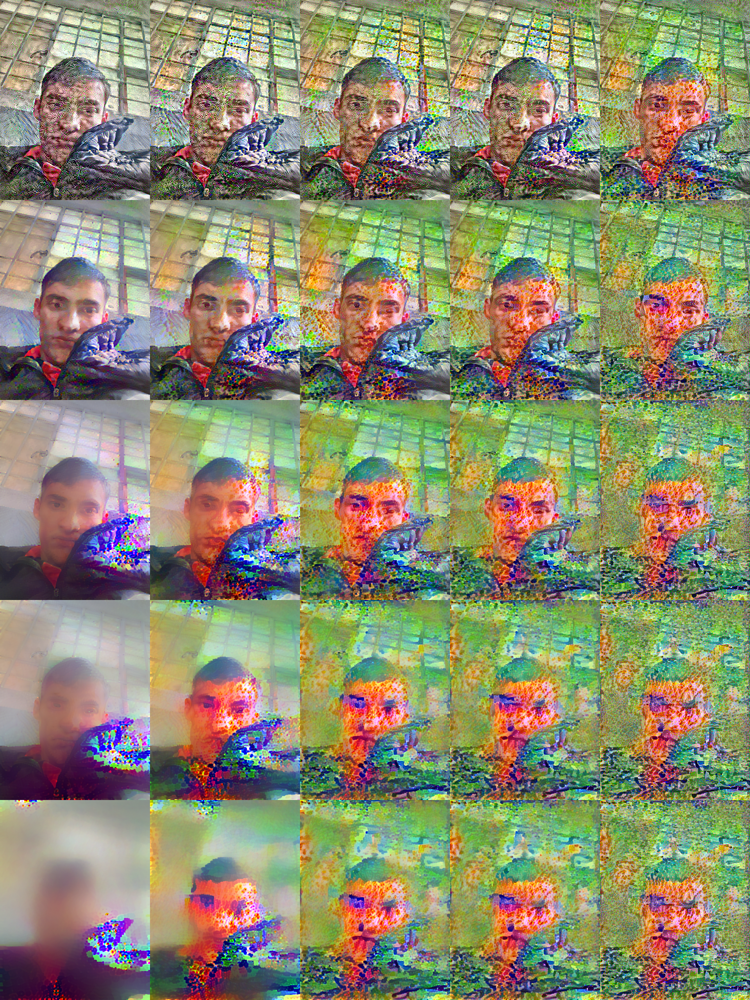

In [ ]:
for im in ima:
  im = cv2.resize(im, dsize=(0, 0), fx=0.5, fy=0.5)
  

im_tile = concat_tile([[ima[21], ima[22], ima[20], ima[23], ima[24]],
                       [ima[16], ima[17], ima[15], ima[18], ima[19]],
                       [ima[11], ima[12], ima[10], ima[13], ima[14]],                       
                       [ima[6], ima[7], ima[5], ima[8], ima[9]],
                       ima[0:5]])

im_tile = cv2.rotate(im_tile, cv2.ROTATE_180)#90_CLOCKWISE)
cv2_imshow(im_tile)

In [ ]:
cv2.imwrite('/content/drive/MyDrive/Tesis/mosaico/C1E2.jpg',imtile)

In [ ]:
imagen = cv2.imread('/content/drive/MyDrive/Tesis/Base/C1.jpg')
i1 = cv2.rotate(imagen, cv2.ROTATE_90_CLOCKWISE)
i2 = cv2.rotate(imagen, cv2.ROTATE_180)
i3 = cv2.rotate(imagen, cv2.ROTATE_90_COUNTERCLOCKWISE)
cv2.imwrite('/content/drive/MyDrive/Tesis/Otros/i1.jpg',i1)
cv2.imwrite('/content/drive/MyDrive/Tesis/Otros/i2.jpg',i2)
cv2.imwrite('/content/drive/MyDrive/Tesis/Otros/i3.jpg',i3)

In [ ]:
plt.axes(im_tile)

In [ ]:
print(type(im_tile))
directory = '/content/drive/MyDrive/Tesis/Mosaico'
os.chdir(directory)
print(os.listdir(directory)) 

In [ ]:
#Image.fromarray(im_tile).save('yodiv')
cv2.imwrite('yodiv', im_tile)

# Error medio

In [ ]:
def rmsdiff(im1, im2):
    "Calculate the root-mean-square difference between two images"
    diff = ImageChops.difference(im1, im2)
    h = diff.histogram()
    sq = (value*((idx%256)**2) for idx, value in enumerate(h))
    sum_of_squares = sum(sq)
    rms = math.sqrt(sum_of_squares/float(im1.size[0] * im1.size[1]))
    return rms

In [ ]:
a5 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==1beta=1e-05.png')
a4 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==1beta=0.0001.png')
a3 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==1beta=0.0005.png')
a2 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==1beta=0.001.png')
a1 = Image.open('/content/drive/MyDrive/Tesis/Final/alfa==1beta=0.01.png')

In [ ]:
print(rmsdiff(beta5,beta4))
print(rmsdiff(beta4,beta3))
print(rmsdiff(beta3,beta2))
print(rmsdiff(beta2,beta1))

print(rmsdiff(alfa5,alfa4))
print(rmsdiff(alfa4,alfa3))
print(rmsdiff(alfa3,alfa2))
print(rmsdiff(alfa2,alfa1))

In [ ]:
'''
alfa1 = cv2.imread('/content/drive/MyDrive/Tesis/Alfa/alfa==-1000.png')
alfa2 = cv2.imread('/content/drive/MyDrive/Tesis/Alfa/alfa==-100.png')
alfa3 = cv2.imread('/content/drive/MyDrive/Tesis/Alfa/alfa==100.png')
alfa4 = cv2.imread('/content/drive/MyDrive/Tesis/Alfa/alfa==1000.png')
alfa5 = cv2.imread('/content/drive/MyDrive/Tesis/Alfa/alfa==10000.png')
alfa6 = cv2.imread('/content/drive/MyDrive/Tesis/Alfa/alfa==100000.png')
alfa7 = cv2.imread('/content/drive/MyDrive/Tesis/Alfa/alfa==1000000.png')
alfa8 = cv2.imread('/content/drive/MyDrive/Tesis/Alfa/alfa==10000000.png')
'''
beta4 = cv2.imread('/content/drive/MyDrive/Tesis/Beta_débil/beta==1.png')
beta3 = cv2.imread('/content/drive/MyDrive/Tesis/Beta_débil/beta==10.png')
beta2 = cv2.imread('/content/drive/MyDrive/Tesis/Beta_débil/beta==100.png')
beta1 = cv2.imread('/content/drive/MyDrive/Tesis/Beta_débil/beta==1000.png')


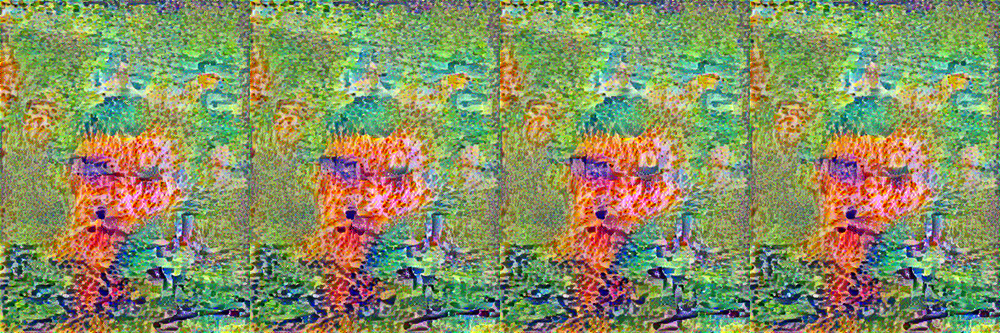

In [ ]:
im1 = [beta4,beta3,beta2,beta1]
for im in im1:
  im = cv2.resize(im, dsize=(0, 0), fx=0.5, fy=0.5)
  
im_tile = concat_tile([im1])
'''
im_tile = concat_tile([[im1[0]],
                       [im1[1]],
                       [im1[2]],
                       [im1[3]],
                       [im1[4]]])
'''
im_tile = cv2.rotate(im_tile, cv2.ROTATE_180)#_CLOCKWISE)
cv2_imshow(im_tile)

# Información mutua


In [ ]:
plt.rcParams['image.cmap'] = 'gray'
plt.rcParams['image.interpolation'] = 'nearest'

In [ ]:
%matplotlib inline

In [ ]:
alfa5 = Image.open('/content/drive/MyDrive/Tesis/Alfa_beta_C1_E1/alfa10ala-5beta10ala-5.png')
alfa4 = Image.open('/content/drive/MyDrive/Tesis/Alfa_beta_C1_E1/alfa10ala-4beta10ala-5.png')
alfa3 = Image.open('/content/drive/MyDrive/Tesis/Alfa_beta_C1_E1/alfa10ala-3beta10ala-5.png')
alfa2 = Image.open('/content/drive/MyDrive/Tesis/Alfa_beta_C1_E1/alfa10ala-2beta10ala-5.png')
alfa1 = Image.open('/content/drive/MyDrive/Tesis/Alfa_beta_C1_E1/alfa10ala-1beta10ala-5.png')

beta5 = Image.open('/content/drive/MyDrive/Tesis/Alfa_beta_C1_E1/alfa10ala-5beta10ala-5.png')
beta4 = Image.open('/content/drive/MyDrive/Tesis/Alfa_beta_C1_E1/alfa10ala-5beta10ala-4.png')
beta3 = Image.open('/content/drive/MyDrive/Tesis/Alfa_beta_C1_E1/alfa10ala-5beta10ala-3.png')
beta2 = Image.open('/content/drive/MyDrive/Tesis/Alfa_beta_C1_E1/alfa10ala-5beta10ala-2.png')
beta1 = Image.open('/content/drive/MyDrive/Tesis/Alfa_beta_C1_E1/alfa10ala-5beta10ala-1.png')

alfa5 = asarray(alfa5)
alfa4 = asarray(alfa4)
alfa3 = asarray(alfa3)
alfa2 = asarray(alfa2)
alfa1 = asarray(alfa1)

beta5 = asarray(beta5)
beta4 = asarray(beta4)
beta3 = asarray(beta3)
beta2 = asarray(beta2)
beta1 = asarray(beta1)

alfa = [alfa5, alfa4, alfa3, alfa2, alfa1]
beta = [beta5, beta4, beta3, beta2, beta1]

In [ ]:
for i in range(len(alfa) - 1):
  hist_2d, x_edges, y_edges = np.histogram2d(
    alfa[i].ravel(),
    alfa[i + 1].ravel(),
    bins=20)
  print(mutual_information(hist_2d))

for i in range(len(beta) - 1):
  hist_2d, x_edges, y_edges = np.histogram2d(
    beta[i].ravel(),
    beta[i + 1].ravel(),
    bins=20)
  print(mutual_information(hist_2d))

In [ ]:
t1_data = beta5
t2_data = beta4
# Show the images by stacking them left-right with hstack
t1_slice = t1_data[:, :]
t2_slice = t2_data[:, :]
plt.pyplot.imshow(np.hstack((t1_slice, t2_slice)))

In [ ]:
hist_2d, x_edges, y_edges = np.histogram2d(
    t1_slice.ravel(),
    t2_slice.ravel(),
    bins=20)
# Plot as image, arranging axes as for scatterplot
# We transpose to put the T1 bins on the horizontal axis
# and use 'lower' to put 0, 0 at the bottom of the plot
plt.pyplot.imshow(hist_2d.T, origin='lower')
plt.pyplot.xlabel('T1 signal bin')
plt.pyplot.ylabel('T2 signal bin')

In [ ]:
# Show log histogram, avoiding divide by 0
hist_2d_log = np.zeros(hist_2d.shape)
non_zeros = hist_2d != 0
hist_2d_log[non_zeros] = np.log(hist_2d[non_zeros])
plt.pyplot.imshow(hist_2d_log.T, origin='lower')
plt.pyplot.xlabel('T1 signal bin')
plt.pyplot.ylabel('T2 signal bin')

In [ ]:
def mutual_information(hgram):
    """ Mutual information for joint histogram
    """
    # Convert bins counts to probability values
    pxy = hgram / float(np.sum(hgram))
    px = np.sum(pxy, axis=1) # marginal for x over y
    py = np.sum(pxy, axis=0) # marginal for y over x
    px_py = px[:, None] * py[None, :] # Broadcast to multiply marginals
    # Now we can do the calculation using the pxy, px_py 2D arrays
    nzs = pxy > 0 # Only non-zero pxy values contribute to the sum
    return np.sum(pxy[nzs] * np.log(pxy[nzs] / px_py[nzs]))

In [ ]:
mutual_information(hist_2d)

In [ ]:
t2_slice_moved = np.zeros(t2_slice.shape)
t2_slice_moved[15:, :] = t2_slice[:-15, :]
plt.imshow(np.hstack((t1_slice, t2_slice_moved)))

In [ ]:
plt.plot(t1_slice.ravel(), t2_slice_moved.ravel(), '.')
plt.xlabel('T1 signal')
plt.ylabel('T2 (moved) signal')
plt.title('T1 vs T2 signal after moving T2 image')

In [ ]:
hist_2d_moved, x_edges, y_edges = np.histogram2d(
    t1_slice.ravel(),
    t2_slice_moved.ravel(),
    bins=20)

In [ ]:
# Show log histogram, avoiding divide by 0
hist_2d_moved_log = np.zeros(hist_2d_moved.shape)
non_zeros = hist_2d_moved != 0
hist_2d_moved_log[non_zeros] = np.log(hist_2d_moved[non_zeros])
plt.imshow(hist_2d_moved_log.T, origin='lower')
plt.xlabel('T1 signal bin')
plt.ylabel('T2 signal bin')

In [ ]:
mutual_information(hist_2d_moved)